<a href="https://colab.research.google.com/github/fudw/dice-detection-for-board-games/blob/main/dice_detect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Pre setting

### If running on Colab, no need to change anything.
### If running locally, set the root variable to your current working directory. E.g. '/home/michael/downloads'

In [1]:
root = '/content'

# I. Setup environment

### Run the next 5 cells without modifications

In [2]:
# Clone repo containing the object detection model and settings
!git clone https://github.com/ultralytics/yolov5 
!pip install -r yolov5/requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 9817, done.
remote: Total 9817 (delta 0), reused 0 (delta 0), pack-reused 9817
Receiving objects: 100% (9817/9817), 10.04 MiB | 17.28 MiB/s, done.
Resolving deltas: 100% (6832/6832), done.
     |████████████████████████████████| 596 kB 7.5 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [3]:
# Clone David's repo for trained weights and test images
!git clone https://github.com/fudw/dice-detection-for-board-games.git

Cloning into 'dice-detection-for-board-games'...
remote: Enumerating objects: 173, done.
remote: Counting objects: 100% (173/173), done.
remote: Compressing objects: 100% (164/164), done.
Receiving objects: 100% (173/173), 59.81 MiB | 22.85 MiB/s, done.
remote: Total 173 (delta 42), reused 61 (delta 1), pack-reused 0
Resolving deltas: 100% (42/42), done.


In [4]:
# Import libraries
%matplotlib inline
import os
from IPython.display import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from google.colab import files

In [5]:
def display_images(image_dir, num_images=3, idx=0):
    '''Displays the first images in a directory
    Args:
    image_dir: string. Path to the directory containing images.
    num_images: int. The number of images to display.
    idx: int. The index of the image to display, when num_images=1.
    '''

    _, axs = plt.subplots(num_images, 1, figsize=(30, 80))
    if num_images > 1:
        for img, ax in zip(os.listdir(image_dir)[:num_images], axs):
            img = mpimg.imread(os.path.join(image_dir, img))
            ax.imshow(img)
            plt.axis("off")
    else:
        plt.Figure(figsize=(40, 100))
        img = mpimg.imread(os.path.join(image_dir, os.listdir(image_dir)[idx]))
        plt.imshow(img)
        plt.axis("off")
    plt.show()

In [6]:
# Change to model directory
os.chdir('yolov5')

# II. Test on existing images

### Run the next 3 cells without modifications. If you see an image with detection boxes displayed, everything is set up correctly.

In [7]:
test_image_dir = os.path.join(root, 'dice-detection-for-board-games/data_finetune_small/images/valid')
weights_path = os.path.join(root, 'dice-detection-for-board-games/weights/best.pt')

In [8]:
# Run this to check if everything is set up correctly
! python detect.py --source $test_image_dir  --weights $weights_path --conf 0.5 --img=2048

detect: weights=['/content/dice-detection-for-board-games/weights/best.pt'], source=/content/dice-detection-for-board-games/data_finetune_small/images/valid, imgsz=[2048, 2048], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-13-gfc36064 torch 1.9.0+cu111 CPU

Fusing layers... 
Model Summary: 232 layers, 7260003 parameters, 0 gradients
image 1/6 /content/dice-detection-for-board-games/data_finetune_small/images/valid/IMG_4541.jpeg: 2048x1536 9 1s, 5 2s, 5 3s, 4 4s, 1 5, Done. (3.583s)
image 2/6 /content/dice-detection-for-board-games/data_finetune_small/images/valid/IMG_4543.jpeg: 2048x1536 11 1s, 5 2s, 1 3, 1 4, 6 5s, Done. (3.468s)
image 3/6 /content/dice-detection-for-board-games/data

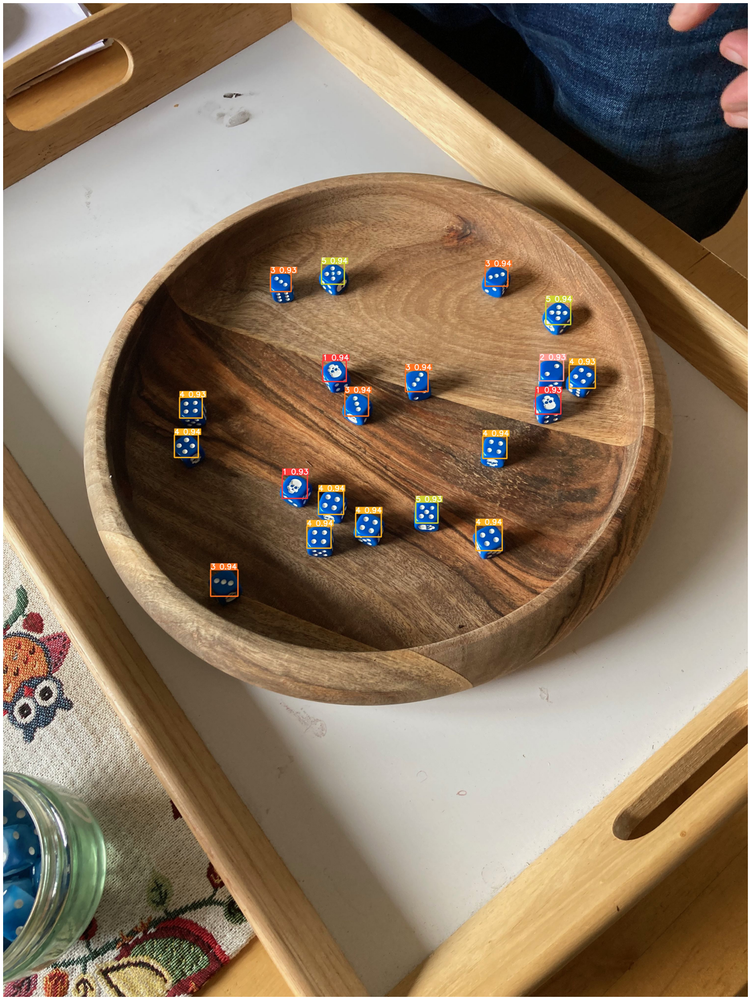

In [9]:
# Visualise sample output images after detection
display_images(os.path.join(root, 'yolov5/runs/detect/exp'), num_images=1, idx=0)

# III. Upload your own images.

### In Google Colab, run the next cell to upload a zip archive containing images. 
### When running locally, simply set the path to a local directory containing the images.

In [10]:
# Upload zip file
uploaded = files.upload()
zip_file = list(uploaded.keys())[0]
!unzip $zip_file -d 'images_to_detect'
detect_image_dir = os.path.join('images_to_detect/')

Saving IMG_4541.zip to IMG_4541.zip
Archive:  IMG_4541.zip
  inflating: images_to_detect/IMG_4541.jpeg  


In [13]:
# *ONLY* when running locally, set this to a directory containing the images
detect_image_dir = None

In [11]:
# Detect images in one directory. 
! python detect.py --source $detect_image_dir  --weights $weights_path --conf 0.5 --img=2048

detect: weights=['/content/dice-detection-for-board-games/weights/best.pt'], source=images_to_detect/, imgsz=[2048, 2048], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-13-gfc36064 torch 1.9.0+cu111 CPU

Fusing layers... 
Model Summary: 232 layers, 7260003 parameters, 0 gradients
image 1/1 /content/yolov5/images_to_detect/IMG_4541.jpeg: 2048x1536 9 1s, 5 2s, 6 3s, 4 4s, 1 5, Done. (3.555s)
Speed: 42.5ms pre-process, 3555.3ms inference, 2.5ms NMS per image at shape (1, 3, 2048, 2048)
Results saved to runs/detect/exp2


In [12]:
# Look at the last line of the output of the previous cell, 
# for text saying something like 'Results saved to runs/detect/exp2'
# Set run_num to the number after 'exp', e.g. 2 or 3 etc.
run_num = 2
output_dir = os.path.join(root, 'yolov5/runs/detect', 'exp' + str(run_num))

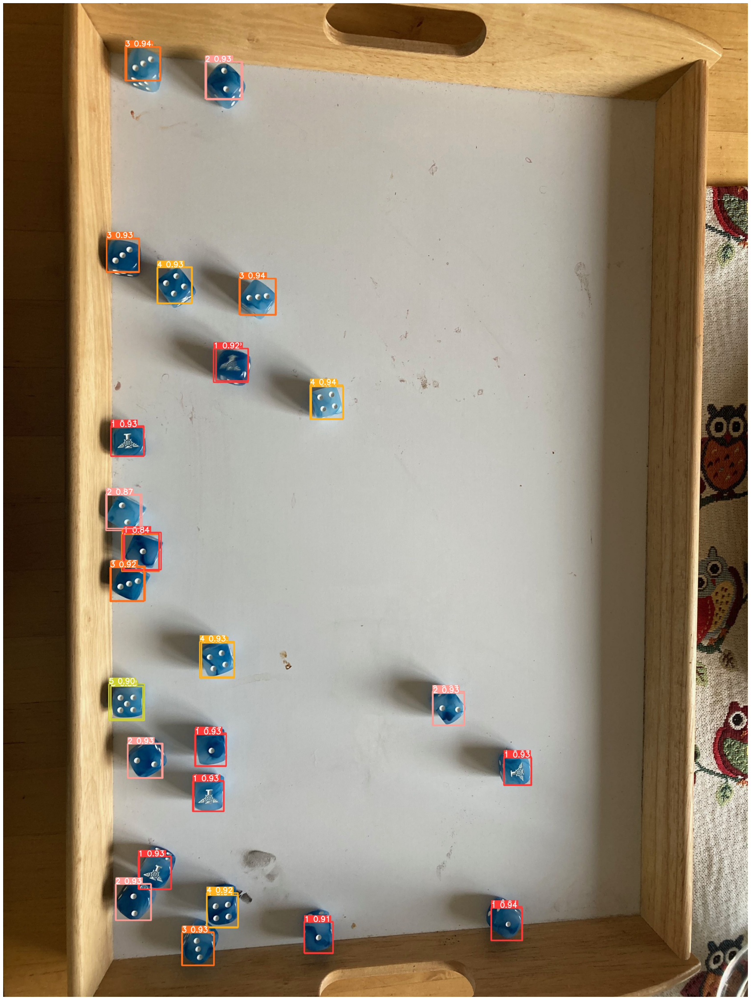

In [13]:
# Visualise sample output images after detection
display_images(output_dir, num_images=1, idx=0)